<a href="https://colab.research.google.com/github/vfedorova/yolov5-droneDetection/blob/main/deploy_DroneDetectionModel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [28]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [29]:
%cd /content/drive/MyDrive/Colab Notebooks/Yolov5


/content/drive/MyDrive/Colab Notebooks/Yolov5


In [30]:
%pip install pafy

In [31]:
%pip install youtube_dl

In [43]:
import numpy as np
import torch
import cv2
import pafy
from time import time
from IPython.display import Image, clear_output

In [33]:
print(torch.__version__)

1.10.0+cu111


In [34]:
!git clone https://github.com/ultralytics/yolov5  # clone

%pip install -qr requirements.txt  # install
import os
from IPython.display import Image, clear_output


import torch
from yolov5 import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 2022-2-16 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.4/78.2 GB disk)


In [35]:
os.environ["DATASET_DIRECTORY"] = "/content/drive/MyDrive/datasets"

In [27]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="VGRqa3hAUj9grPa34Ymo")
project = rf.workspace().project("drone-detection-dp5dg")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/drive/MyDrive/datasets/drone-detection-1 in yolov5pytorch:: 100%|██████████| 4942/4942 [00:39<00:00, 124.84it/s]


In [37]:
%cd /content/drive/MyDrive/Colab Notebooks/Yolov5/yolov5

/content/drive/MyDrive/Colab Notebooks/Yolov5/yolov5


In [38]:
!python train.py --img 416 --batch 16 --epochs 10 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/datasets/drone-detection-1/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=10, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 2022-2-16 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4,

In [39]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [40]:
!python detect.py --weights runs/train/exp/weights/best1.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best1.pt'], source=/content/drive/MyDrive/datasets/drone-detection-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 2022-2-16 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/102 /content/drive/MyDrive/datasets/drone-detection-1/test/images/V_DRONE_001_mp4-100_jpg.rf.bdefa61e20cb18c35a1831a9a0899843.jpg: 416x416 1 drone, Done. (0.028s)
image 2/102 /content/drive/MyDrive/datasets/drone-detection-1/test/images/V_DRONE_001_mp4-102_jpg.rf.595db865cfe8dffc1dddd528e131cdca.jpg: 416x416 1 drone, Done. (0.028

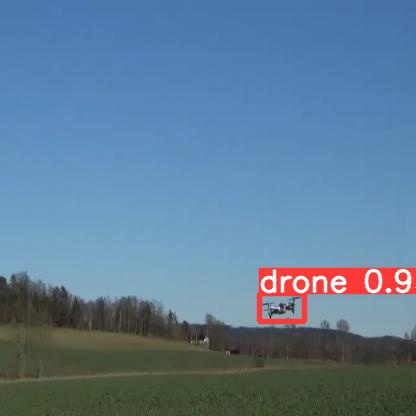

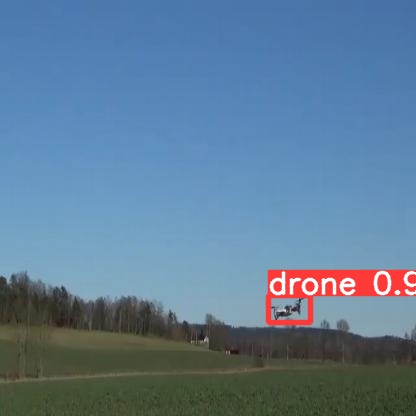

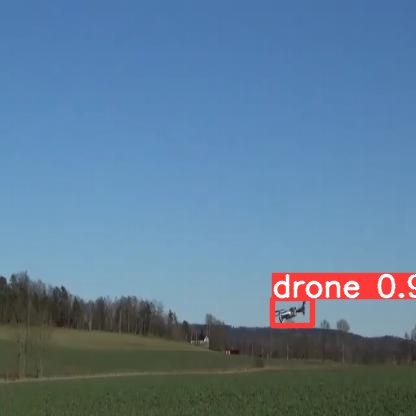

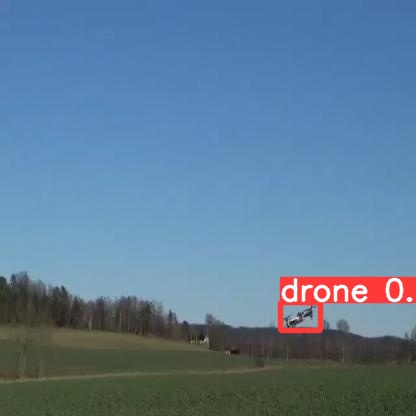

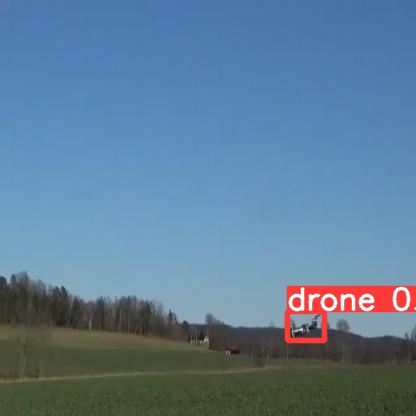

...

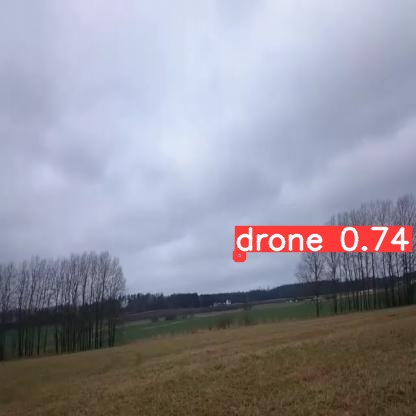

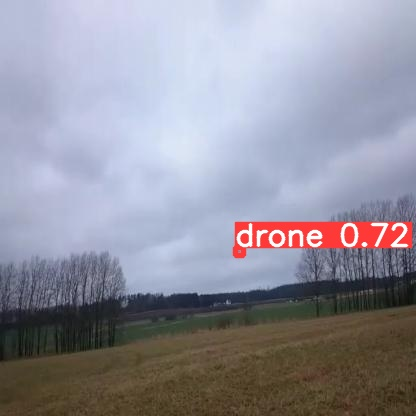

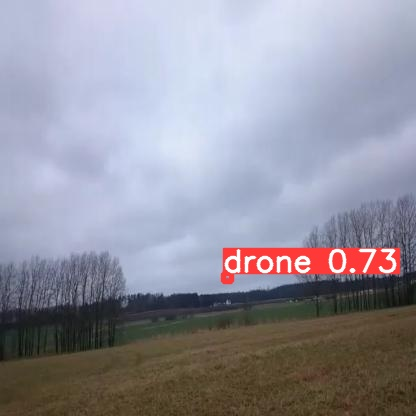

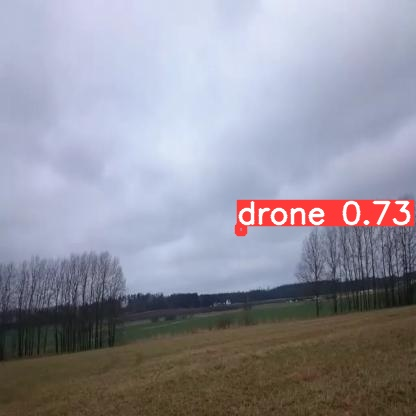

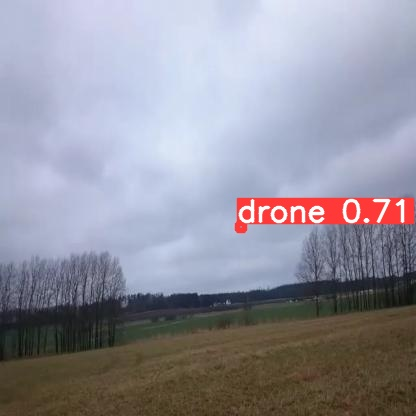

In [45]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/Colab Notebooks/Yolov5/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")
   

In [46]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/datasets/drone-detection-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 2022-2-16 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/102 /content/drive/MyDrive/datasets/drone-detection-1/test/images/V_DRONE_001_mp4-100_jpg.rf.bdefa61e20cb18c35a1831a9a0899843.jpg: 416x416 1 drone, Done. (0.028s)
image 2/102 /content/drive/MyDrive/datasets/drone-detection-1/test/images/V_DRONE_001_mp4-102_jpg.rf.595db865cfe8dffc1dddd528e131cdca.jpg: 416x416 1 drone, Done. (0.028s

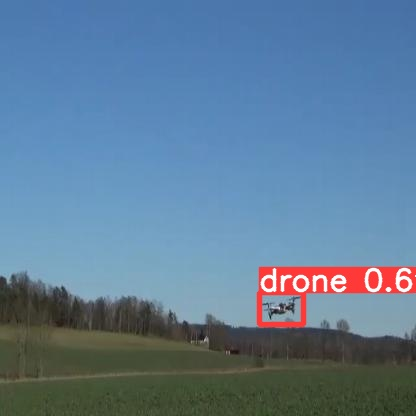

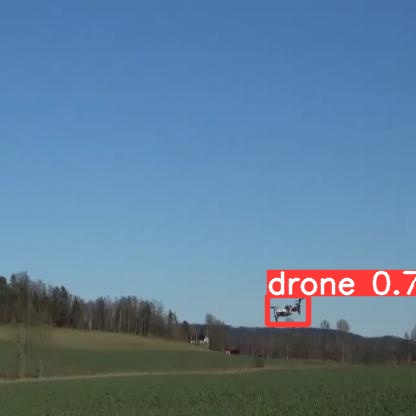

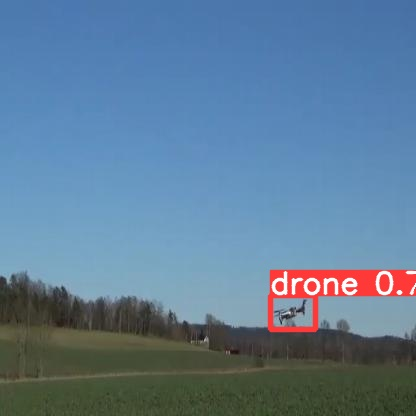

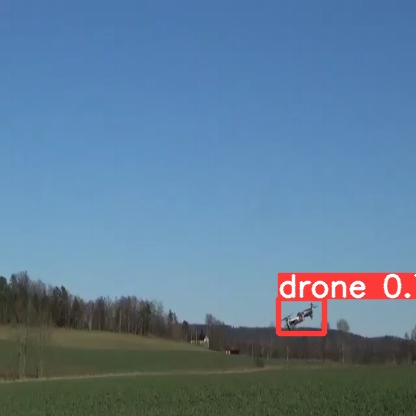

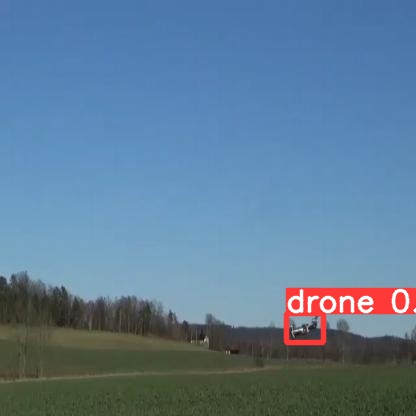

...

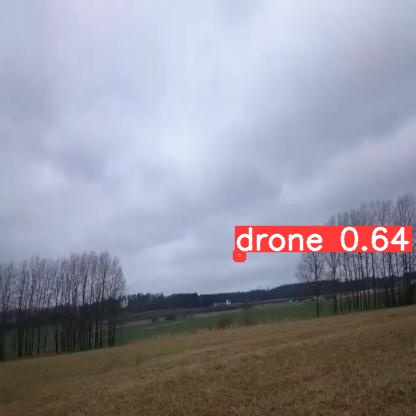

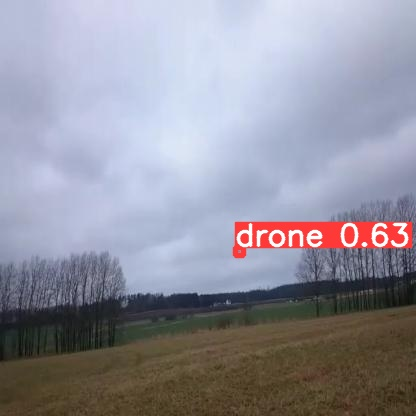

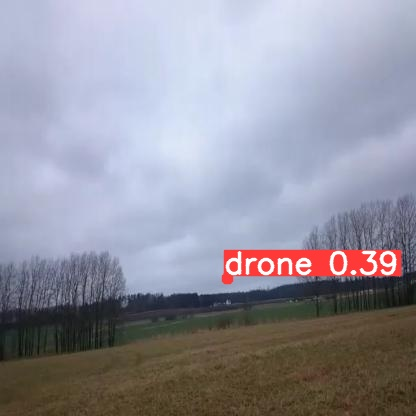

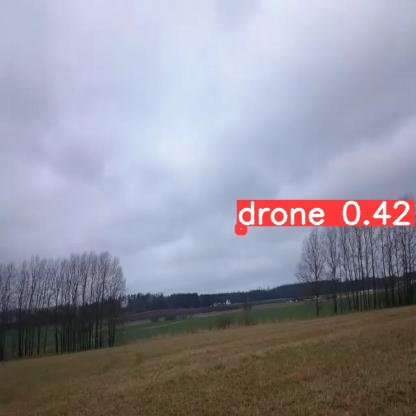

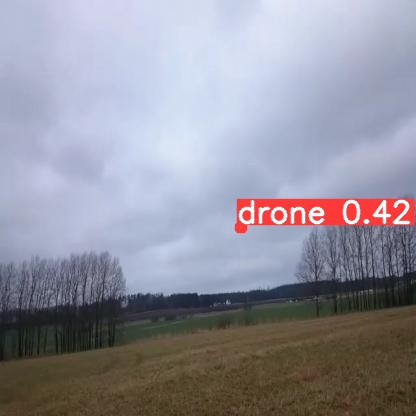

In [47]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/Colab Notebooks/Yolov5/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")